In [ ]:
import os
import numpy as np
import scipy
from sklearn.preprocessing import normalize
import matplotlib.pyplot as plt
from IPython import display
%matplotlib inline

In [ ]:
from google.colab import files
files.upload()
data_npy_file = 'PB_data.npy'

# Loading data from .npy file
data = np.load(data_npy_file, allow_pickle=True)

Saving PB_data.npy to PB_data.npy


In [ ]:
data = np.ndarray.tolist(data)
# Array that contains the phoneme ID (1-10) of each sample
phoneme_id = data['phoneme_id']

# frequencies f1 and f2
f1 = data['f1']
f2 = data['f2']

TypeError: ignored

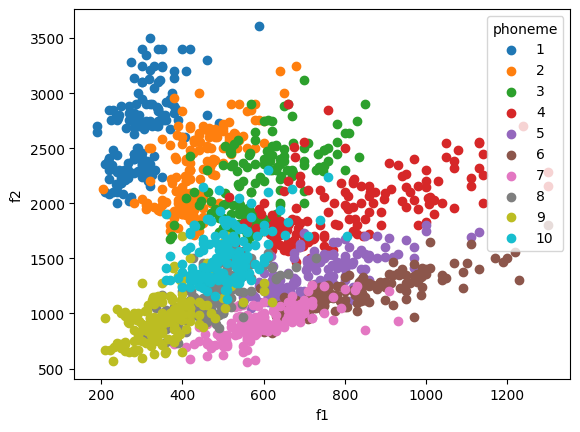

In [ ]:
scatter_data = np.array((phoneme_id, f1,f2)).T
phonemes = np.unique(phoneme_id)

for p in phonemes:
  p_plot = scatter_data[phoneme_id==p.item(),:]
  plt.scatter(p_plot[:,1],p_plot[:, 2], label = p.item())

plt.legend(title = 'phoneme')
plt.xlabel('f1')
plt.ylabel('f2')
plt.show()

# 1. MoG Using Expectation Maximization Algorithm

Let the observed random vector be $\mathbf{x}\in\mathbb{R}^D$, a MoG models $p(\mathbf{x})$ as a sum of $K$ weighted Gaussians

\begin{equation}
 p(\mathbf{x}) = \sum_{k=1}^K \frac{p(c_{k})}{(2\pi)^{D/2} \mathrm{det}\left(\boldsymbol\Sigma_k\right)^{1/2}}
 % \exp(-\frac{1}{2}(x-\mu)^T \sum_{k}^{-1}(x-\mu))
 \exp\left(-\frac{1}{2}(\mathbf{x}-\boldsymbol\mu_k)^\top {\boldsymbol\Sigma_k}^{-1}(\mathbf{x}-\boldsymbol\mu_k)\right),
\end{equation}
where:
* $\boldsymbol\mu_k\in\mathbb{R}^{D}$
* $\boldsymbol\Sigma_{k}\in\mathbb{R}^{D\times D}$
* $p(c_{k})=\pi_k\in\mathbb{R}$

denote the $k$-th gaussian component's **mean vector**, **covariance matrix**, and **mixture coefficients** respectively. The $K$-many gaussian components' model parameters are referred to collectively as $\theta = \{\boldsymbol\mu_k,\boldsymbol\Sigma_{k},\pi_k\}_{k=1}^K$.

## EM Algorithm
Begin by randomly initializing K centroids

For the E step we softly assign each datum to the closest centroid

For the M step we update $\theta$ to maximize the weighted log-likelihood.

In [ ]:
def get_predictions(mu, s, p, X):
	"""
		:param mu			: means of GMM components
		:param s			: covariances of GMM components
		:param p 			: weights of GMM components
		:param X			: 2D array of our dataset
	"""

	# get number of GMM components
	k = s.shape[0]
	# get number of data samples
	N = X.shape[0]
	# get dimensionality of our dataset
	D = X.shape[1]

	Z = np.zeros((N, k))
	for i in range(k):
		#for each gaussian component, retrieve mus
		mu_i = mu[i, :]
		#add axis so its dim of gaussian by 1
		mu_i = np.expand_dims(mu_i, axis=1)
		#repeat so we have mu vector for each data sample
		mu_i_repeated = np.repeat(mu_i, N, axis=1)
		#subtract mu from each row of dataset
		X_minus_mu = X - mu_i_repeated.transpose()
		#calc inverse of cov matrix
		inverse_s = scipy.linalg.pinv(s[i])
		inverse_s = np.squeeze(inverse_s)
		#calc determinant of s
		s_i_det = scipy.linalg.det(s[i])
		#product of X minus mu inverse
		x_s_x = np.matmul(X_minus_mu, inverse_s)*X_minus_mu
		Z[:, i] = p[i]*(1/np.power(((2*np.pi)**D) * np.abs(s_i_det), 0.5)) * np.exp(-0.5*np.sum(x_s_x, axis=1))
	return Z


### Helper functions

In [ ]:
def plot_gaussians(ax, s, mu, X, title_string):
    """
        :param X            : 2D array of our dataset
        :param y            : 1D array of the groundtruth labels of the dataset
        :param ax          : existing subplot, to draw on it
    """
    ax.clear()
    if X.shape[1] == 2:
        # set label of horizontal axis
        ax.set_xlabel('f1')
        # set label of vertical axis
        ax.set_ylabel('f2')
        # scatter the points, with red color
        ax.scatter(X[:,0], X[:,1], c='black', marker='.', label=title_string)

    k = s.shape[0]
    color_list = ['r', 'g', 'b', 'c', 'm', 'y']
    N_sides = 11

    # Iterate over all gaussians
    for k_cnt in range(k):

        # pick the covariance matrix and mean values of each gaussian
        s_k = s[k_cnt]
        mu_k = mu[k_cnt]

        if s_k.shape[0]==2:
            # dataset with 2 features
            side_range = np.arange(0, N_sides, 1)
            theta = side_range/(N_sides-1)*2*np.pi
            matrix = np.array([np.cos(theta), np.sin(theta)])
            mu_k = np.expand_dims(mu_k, axis=1)
            mu_repeated = np.repeat(mu_k, N_sides, axis=1)
            epoints = np.matmul(scipy.linalg.sqrtm(s_k), matrix) + mu_repeated
            plt.plot(epoints[0,:], epoints[1,:], color=color_list[k_cnt], linewidth=2)
            plt.scatter(mu_k[0], mu_k[1], color=color_list[k_cnt], marker='o', linewidth=2)
        elif s_k.shape[0]==3:
            # dataset with 3 features
            side_range = np.arange(0, N_sides, 1)
            theta = side_range/(N_sides-1)*np.pi
            phi = side_range/(N_sides-1)*2*np.pi
            sin_theta = np.expand_dims(np.sin(theta), axis=1)
            cos_theta = np.expand_dims(np.cos(theta), axis=1)
            sin_phi = np.expand_dims(np.sin(phi), axis=1)
            cos_phi = np.expand_dims(np.cos(phi), axis=1)
            sx = np.matmul(sin_theta, cos_phi.transpose())
            sy = np.matmul(sin_theta, sin_phi.transpose())
            sz = np.matmul(cos_theta, np.ones((1, N_sides)))
            svect = np.array([sx.reshape((N_sides*N_sides)), sy.reshape((N_sides*N_sides)), sz.reshape((N_sides*N_sides))])

            mu_k = np.expand_dims(mu_k, axis=1)
            mu_repeated = np.repeat(mu_k, N_sides*N_sides, axis=1)
            epoints = np.matmul(scipy.linalg.sqrtm(s_k), svect) + mu_repeated

            ex = epoints[0]
            ey = epoints[1]
            ez = epoints[2]

            ax.plot3D(epoints[0,:], epoints[1,:], epoints[2,:], color=color_list[k_cnt])
            ax.plot3D(ex, ey, ez, color=color_list[k_cnt])
        else:
            print('Each dataset sample should have either 2 or 3 features. Not plotting this one.')
    ax.legend()
    display.clear_output(wait=True)
    display.display(plt.gcf())

def plot_data_3D(X, title_string, ax):
    """
        :param X            : 2D array of our dataset
        :param y            : 1D array of the groundtruth labels of the dataset
        :param ax          : existing subplot, to draw on it
    """
    # clear subplot from previous (if any) drawn stuff
    ax.clear()
    # set label of x axis
    ax.set_xlabel('f1')
    # set label of y axis
    ax.set_ylabel('f2')
    # set label of z axis
    ax.set_zlabel('f1 + f2')
    # scatter the points, with red color
    ax.scatter3D(X[:,0], X[:,1], X[:,2], c='black', marker='.', label=title_string)
    # add legend to the subplot
    ax.legend()


def save_model(mu, s, p):
  GMM_parameters = {}
  GMM_parameters['mu'] = mu
  GMM_parameters['s'] = s
  GMM_parameters['p'] = p
  if not os.path.isdir('data/'):
    os.mkdir('data/')
  npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
  np.save(npy_filename, GMM_parameters)

## Train MoG

Read the following blocks of code and understand what it does.

In [ ]:
k = 3
# id of the phoneme that will be used (e.g. 1, or 2)
p_id = 1
X_full = np.zeros((len(f1), 2))
X_full[:,0] = f1.copy()
X_full[:,1] = f2.copy()
X_full = X_full.astype(np.float32)

X = X_full[phoneme_id==p_id,:]

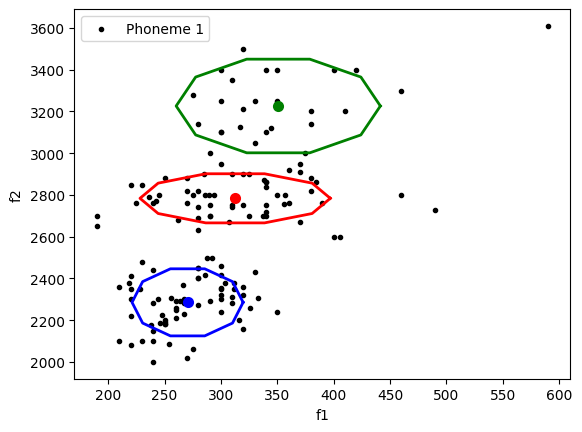


Finished.

Mu Vectors

[[ 312.59125 2783.898  ]
 [ 350.8446  3226.3394 ]
 [ 270.3952  2285.4653 ]]
Covariance Matrices

[[[ 3562.59743765     0.        ]
  [    0.          7657.84897245]]

 [[ 4102.875375       0.        ]
  [    0.         27829.54221426]]

 [[ 1213.73843494     0.        ]
  [    0.         14278.4202995 ]]]
Mixture Coefficients

[0.38099528 0.18386038 0.43514434]


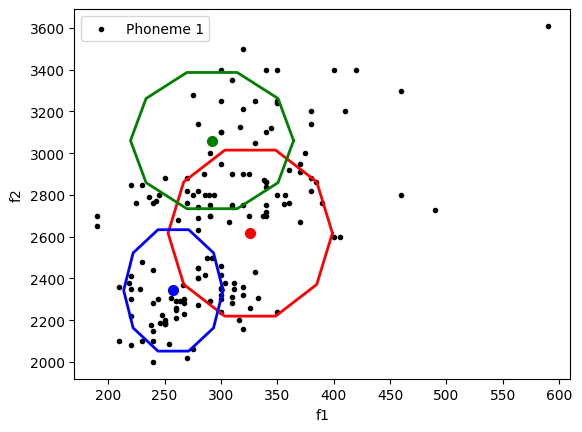

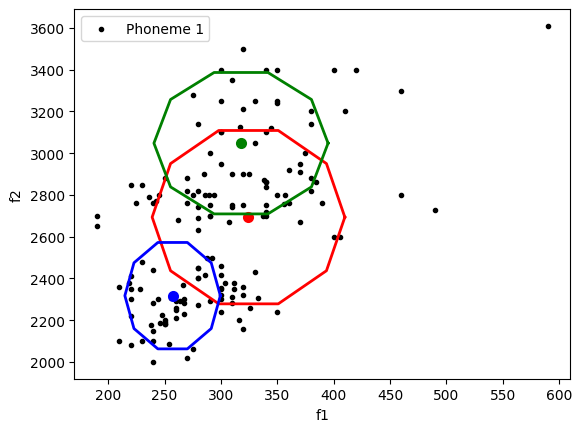

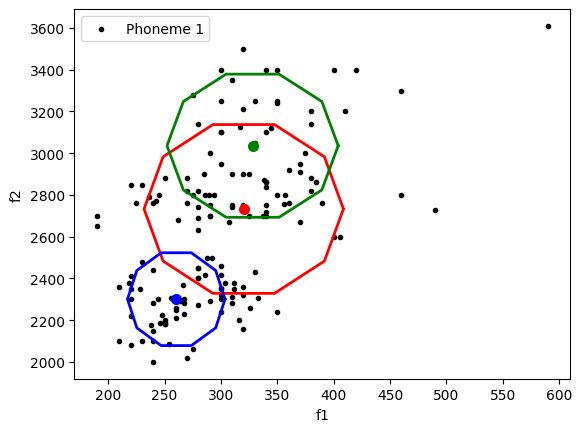

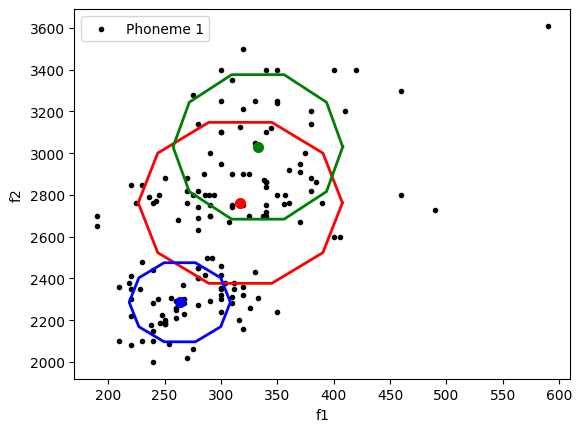

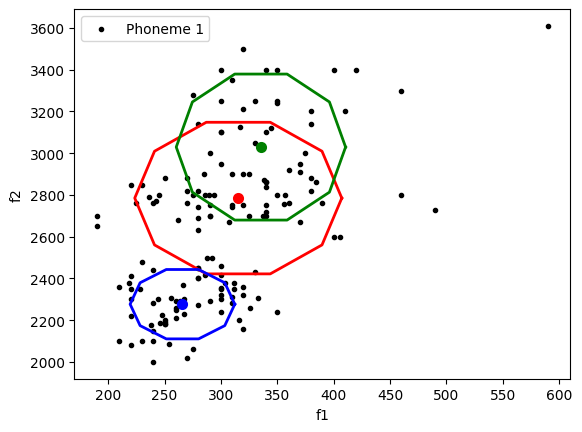

...

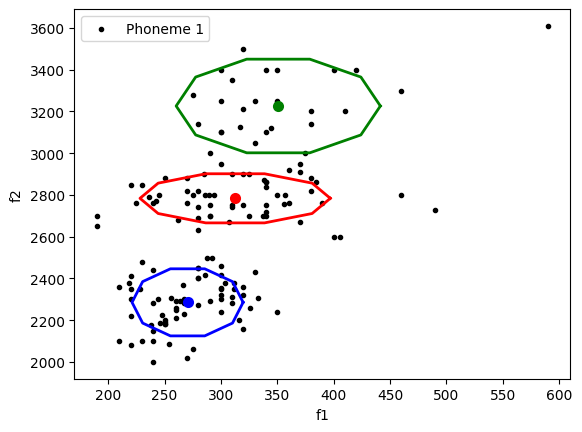

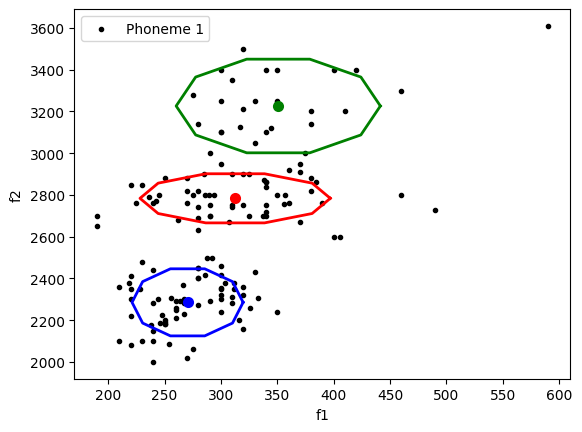

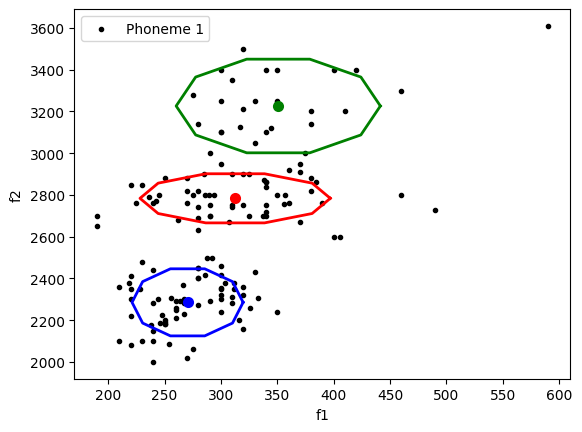

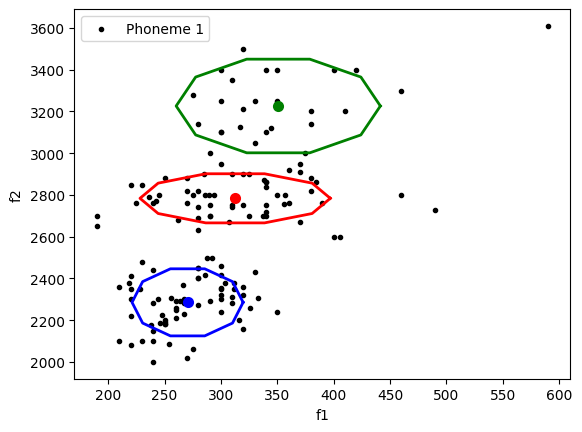

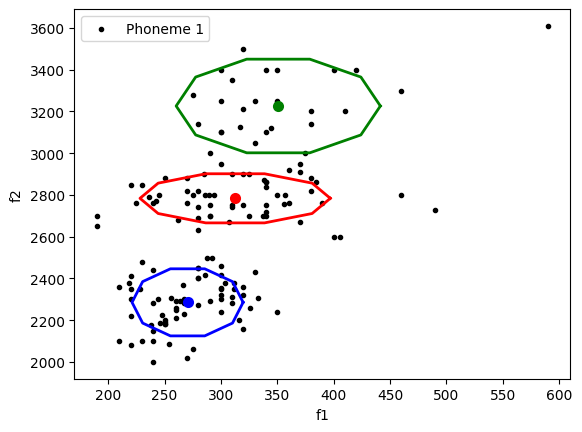

In [ ]:
#first run for p=1 and k=3

# get number of samples
N = X.shape[0]
# get dimensionality of our dataset
D = X.shape[1]
# common practice : GMM weights initially set as 1/k
p = np.ones((k))/k
# GMM means are picked randomly from data samples
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
# covariance matrices
s = np.zeros((k,D,D)) # shape kxDxD
# number of iterations for the EM algorithm
n_iter = 100

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    # initially set to fraction of data covariance
    s[i,:,:] = cov_matrix/k

# Initialize array Z that will get the predictions of each Gaussian on each sample
Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
n_iter = 100
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    #nxk where each row sums to 1
    #p of obs n being in class k
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')

    # Do the M-step:
    for i in range(k):
        # dxn set of data times nx1 set of probabilities of each obs being in class i
        #returns dx1 vector with columns representing the mu of each dim in model i
        mu[i,:] = np.matmul(X.transpose(),Z[:,i]) / np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with diagonal covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        #dxn matrix with each row containing the mus of dimension d
        mu_i_repeated = np.repeat(mu_i, N, axis=1)

        #dxn matrix of data - dxn matrix of means
        #dxn is squared elementwise to produce first term of cov matrix
        #only need to calc dimension variances so this approach is used
        coef_1 = (X.transpose() - mu_i_repeated)**2

        # n vector with normalized prob of each observation being in gaussian i
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)

        #weighted variances of dimensions in dist i
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        #reformatted as diag dxd matrix
        s[i,:,:] = np.diag(res_1)

        p[i] = np.mean(Z[:,i])

    fig, ax1 = plt.subplots()
    if n_iter%10 = 0:
      plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
print('\nFinished.\n')
print('Mu Vectors\n')
print(mu)

print('Covariance Matrices\n')
print(s)

print('Mixture Coefficients\n')
print(p)

Repeating Training for label 2

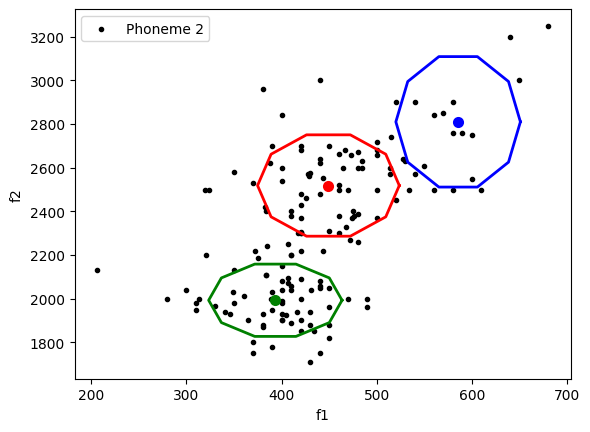


Finished.

Mu Vectors

[[ 449.19247 2518.5361 ]
 [ 393.40814 1992.6295 ]
 [ 585.5456  2810.4087 ]]
Covariance Matrices

[[[ 2775.60143106     0.        ]
  [    0.         29825.14714629]]

 [[ 2457.31476076     0.        ]
  [    0.         15176.75610731]]

 [[ 2142.69798718     0.        ]
  [    0.         49412.25233549]]]
Mixture Coefficients

[0.46868584 0.43427996 0.0970342 ]


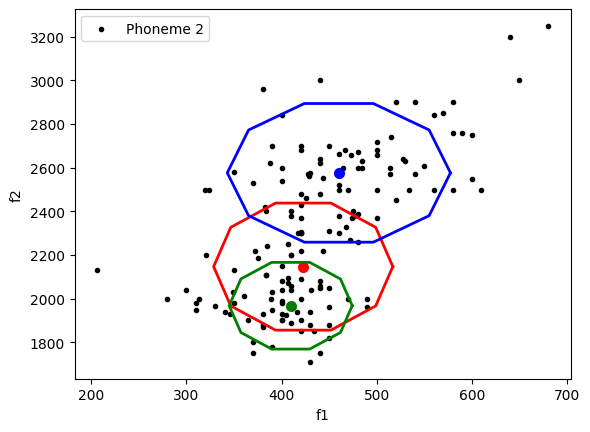

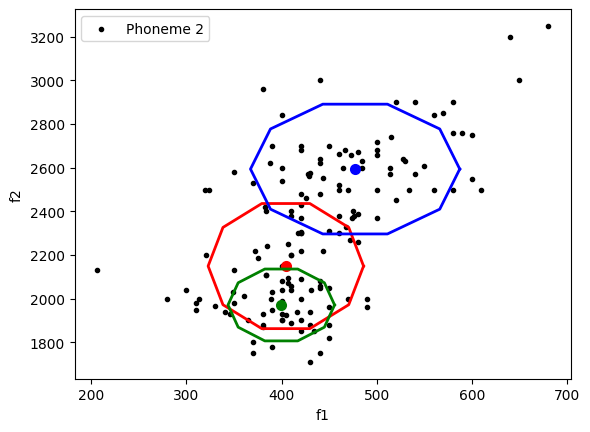

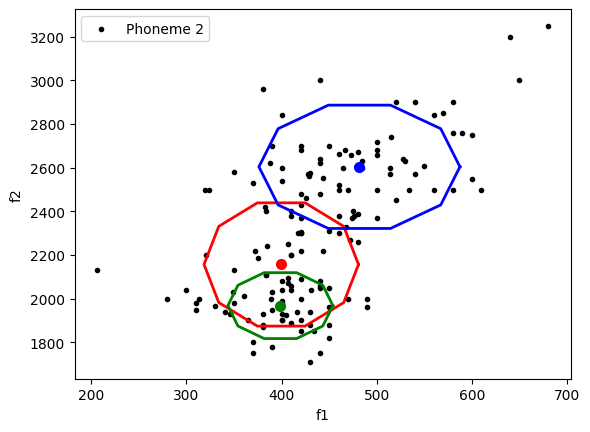

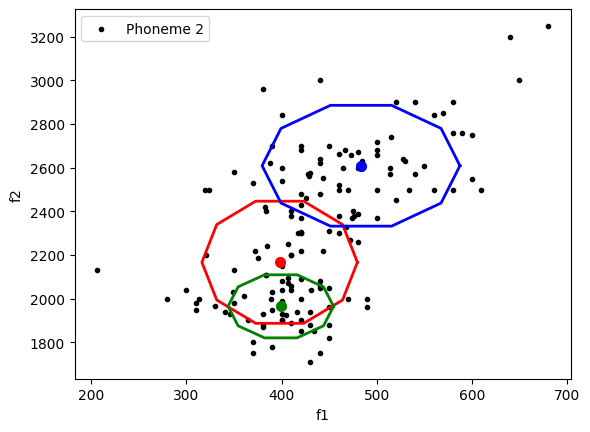

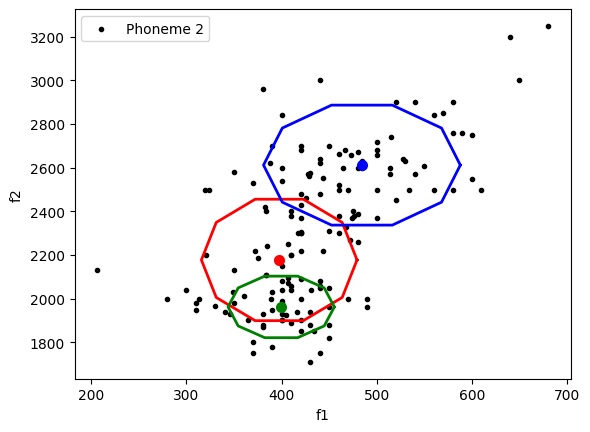

...

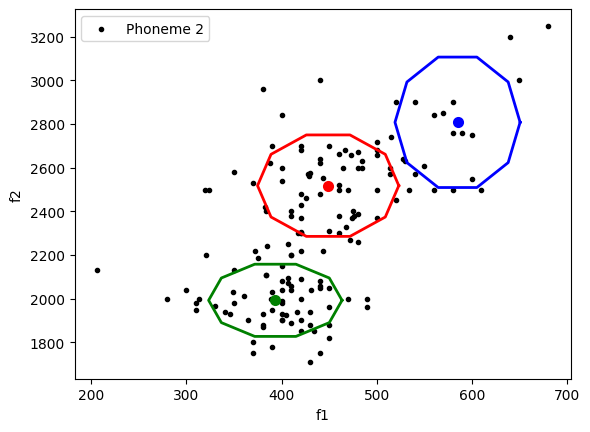

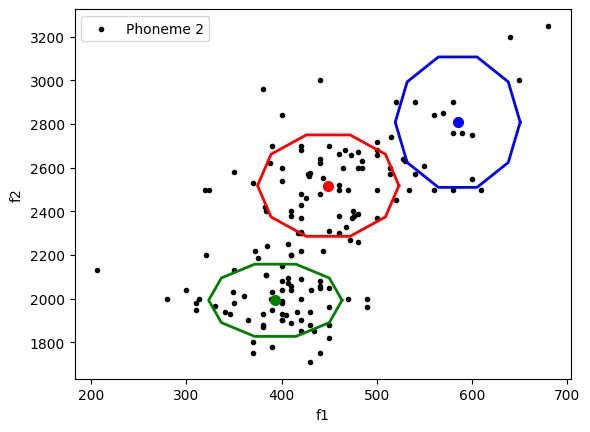

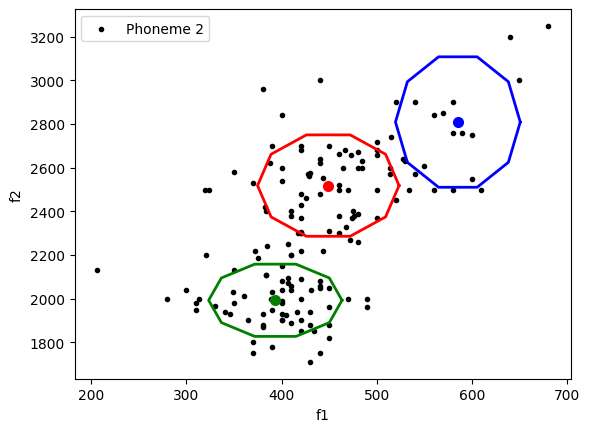

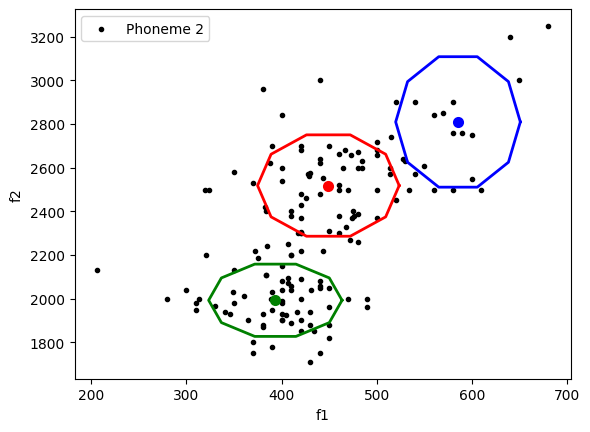

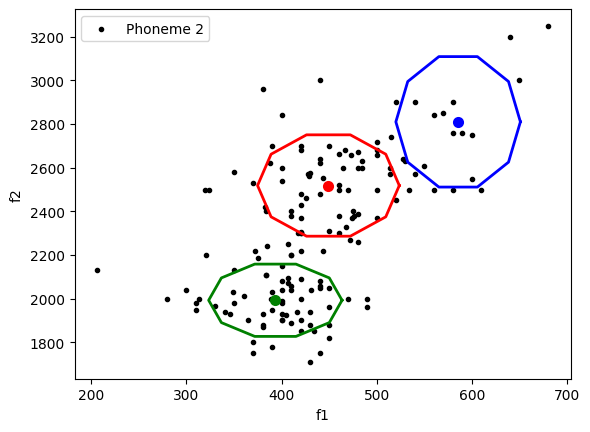

In [ ]:
k=3
p_id = 2

X = X_full[phoneme_id==p_id,:]

# get number of samples
N = X.shape[0]
# get dimensionality of our dataset
D = X.shape[1]
# common practice : GMM weights initially set as 1/k
p = np.ones((k))/k
# GMM means are picked randomly from data samples
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
# covariance matrices
s = np.zeros((k,D,D)) # shape kxDxD
# number of iterations for the EM algorithm
n_iter = 100

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    # initially set to fraction of data covariance
    s[i,:,:] = cov_matrix/k

# Initialize array Z that will get the predictions of each Gaussian on each sample
Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
n_iter = 100
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')

    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(),Z[:,i]) / np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with diagonal covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)

        p[i] = np.mean(Z[:,i])

    fig, ax1 = plt.subplots()
    if n_iter%10 = 0:
      plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
print('\nFinished.\n')
print('Mu Vectors\n')
print(mu)

print('Covariance Matrices\n')
print(s)

print('Mixture Coefficients\n')
print(p)
save_model(mu, s, p)

Repeating training for labels 1 and 2 with hyperparameter K=6

In [1]:
#K=6, p=1
k=6
p_id = 1

X = X_full[phoneme_id==p_id,:]

# get number of samples
N = X.shape[0]
# get dimensionality of our dataset
D = X.shape[1]
# common practice : GMM weights initially set as 1/k
p = np.ones((k))/k
# GMM means are picked randomly from data samples
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
# covariance matrices
s = np.zeros((k,D,D)) # shape kxDxD
# number of iterations for the EM algorithm
n_iter = 100

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    # initially set to fraction of data covariance
    s[i,:,:] = cov_matrix/k

# Initialize array Z that will get the predictions of each Gaussian on each sample
Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
n_iter = 100
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')

    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(),Z[:,i]) / np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with diagonal covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)

        p[i] = np.mean(Z[:,i])

    fig, ax1 = plt.subplots()
    plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
print('\nFinished.\n')
print('Mu Vectors\n')
print(mu)

print('Covariance Matrices\n')
print(s)

print('Mixture Coefficients\n')
print(p)
save_model(mu, s, p)

NameError: name 'X_full' is not defined

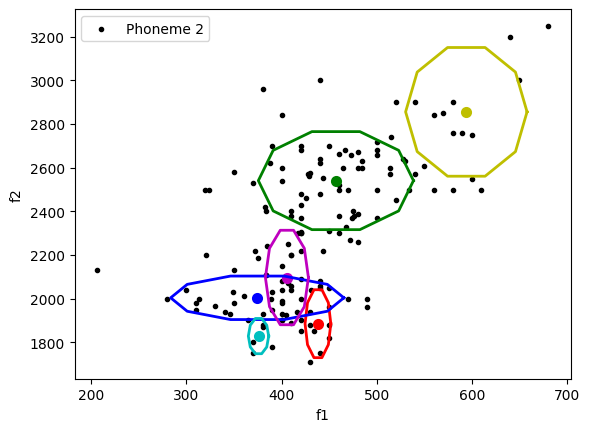


Finished.

Mu Vectors

[[ 438.17178 1885.214  ]
 [ 457.06503 2540.9265 ]
 [ 374.393   2003.853  ]
 [ 375.71155 1828.4396 ]
 [ 405.55582 2096.909  ]
 [ 594.16895 2856.1406 ]]
Covariance Matrices

[[[   91.76739184     0.        ]
  [    0.         13391.63962556]]

 [[ 3323.62247198     0.        ]
  [    0.         27896.05482096]]

 [[ 4142.92506746     0.        ]
  [    0.          5492.05174863]]

 [[   57.27288222     0.        ]
  [    0.          3606.45529967]]

 [[  255.79209083     0.        ]
  [    0.         25912.81721567]]

 [[ 2037.45646594     0.        ]
  [    0.         48089.43144083]]]
Mixture Coefficients

[0.05644804 0.45566823 0.19128754 0.03043535 0.19088128 0.07527955]


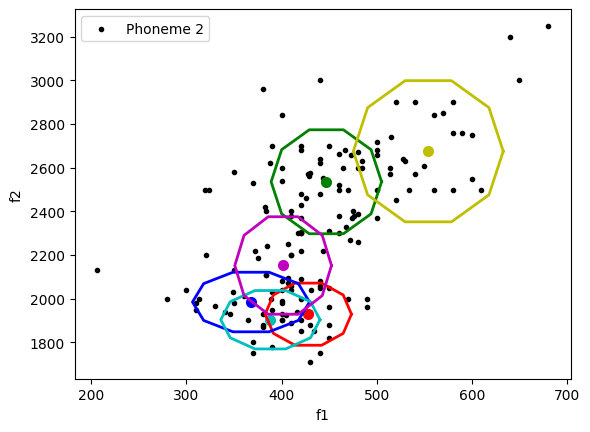

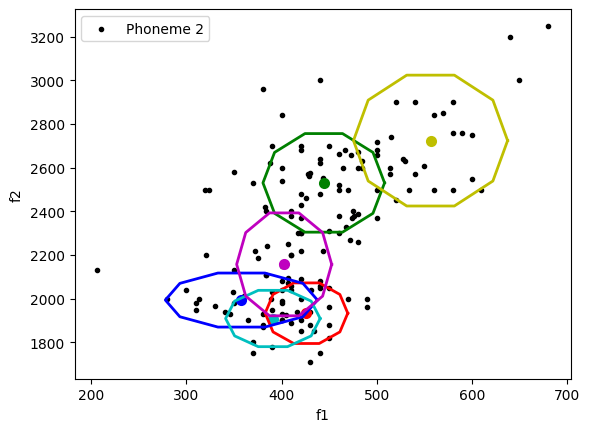

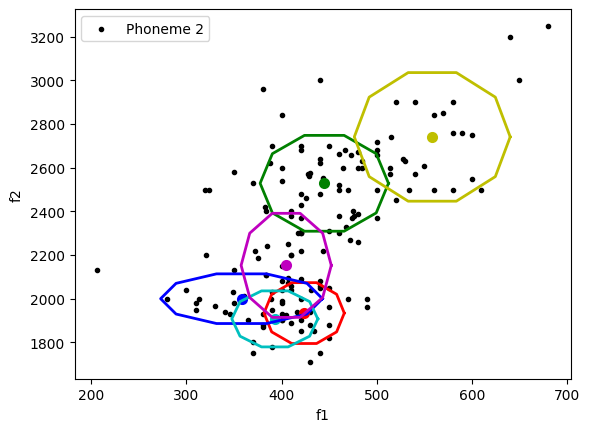

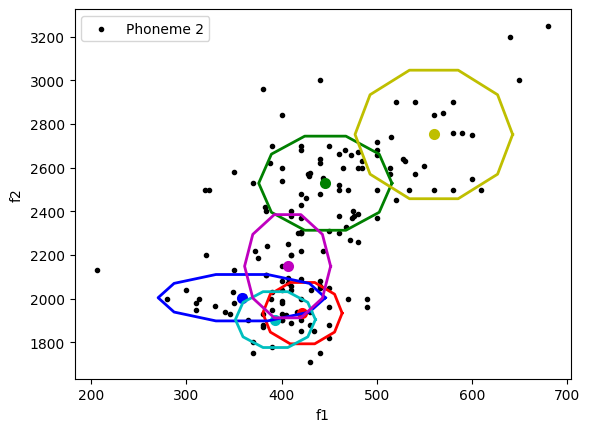

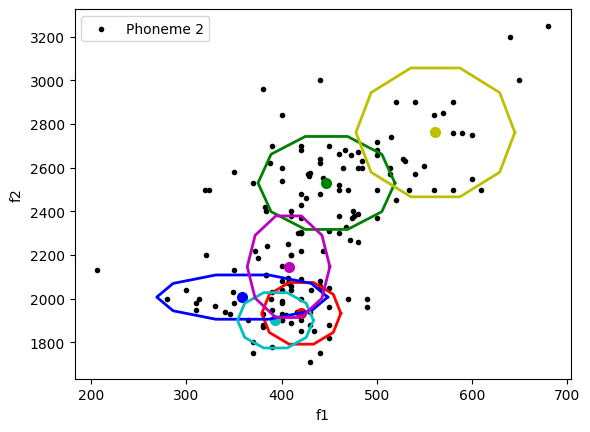

...

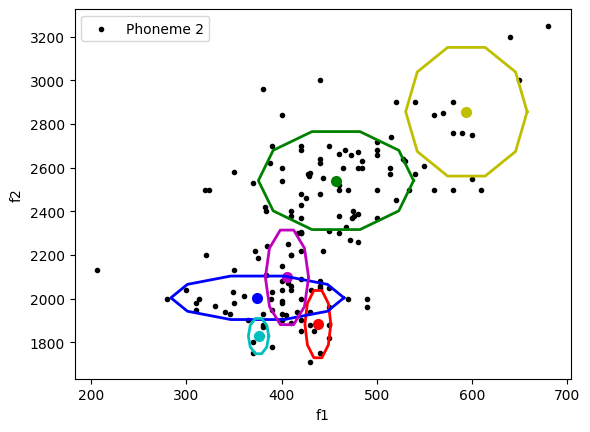

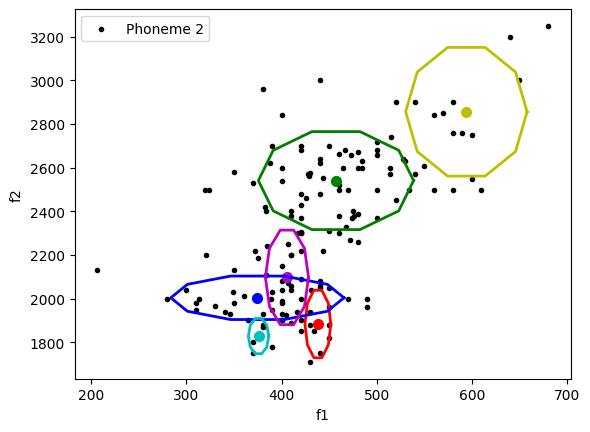

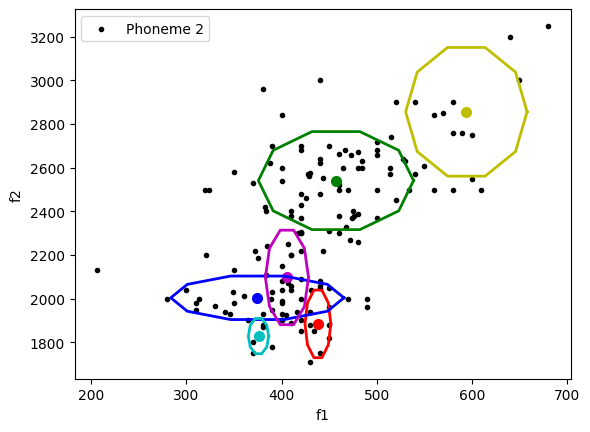

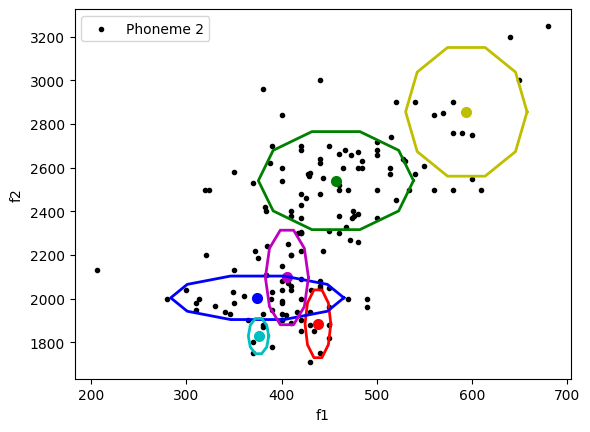

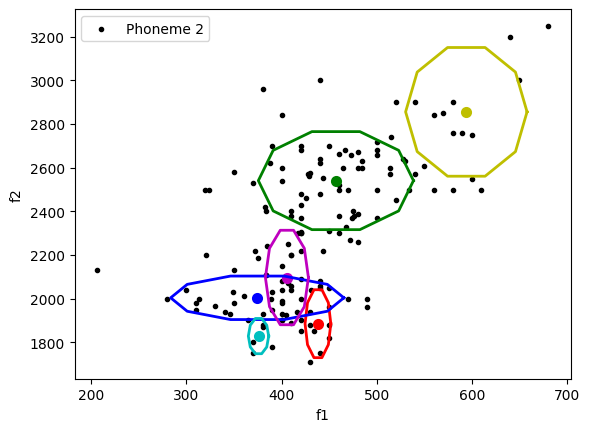

In [ ]:
#K=6, p=2
k=6
p_id = 2
X = X_full[phoneme_id==p_id,:]

# get number of samples
N = X.shape[0]
# get dimensionality of our dataset
D = X.shape[1]
# common practice : GMM weights initially set as 1/k
p = np.ones((k))/k
# GMM means are picked randomly from data samples
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
# covariance matrices
s = np.zeros((k,D,D)) # shape kxDxD
# number of iterations for the EM algorithm
n_iter = 100

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    # initially set to fraction of data covariance
    s[i,:,:] = cov_matrix/k

# Initialize array Z that will get the predictions of each Gaussian on each sample
Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
n_iter = 100
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')

    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(),Z[:,i]) / np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with diagonal covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)

        p[i] = np.mean(Z[:,i])

    fig, ax1 = plt.subplots()
    plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
print('\nFinished.\n')
print('Mu Vectors\n')
print(mu)

print('Covariance Matrices\n')
print(s)

print('Mixture Coefficients\n')
print(p)
save_model(mu, s, p)


Classify using the Maximum Likelihood (ML) criterion: $p(\mathbf{x};\boldsymbol\theta_{1})$ to $p(\mathbf{x};\boldsymbol\theta_{2})$


 $\boldsymbol\theta_{i}$ are the parameters of the MoG learnt for the ith phoneme

In [ ]:
k = 3
inds_1 = np.where(phoneme_id==1)
inds_2 = np.where(phoneme_id==2)
inds_1 = inds_1[0]
inds_2 = inds_2[0]
inds_1_and_2 = np.concatenate((inds_1, inds_2), axis=0)

X = X_full[inds_1_and_2,:]
Y = phoneme_id[inds_1_and_2]

N = X.shape[0]
D = X.shape[1]

# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 1
p_id = 1
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_1 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_1 = np.ndarray.tolist(GMM_parameters_phoneme_1)
else:
    raise('File {} does not exist.'.format(npy_filename))
mu = GMM_parameters_phoneme_1['mu']
s = GMM_parameters_phoneme_1['s']
p = GMM_parameters_phoneme_1['p']

# Initialize array Z_phoneme_1 that will get the predictions of each Gaussian on each sample
Z_phoneme_1 = np.zeros((N,k)) # shape Nxk

# get predictions
#Loop taken from get predictions function

for i in range(k):
		#for each gaussian component, retrieve mus
		mu_i = mu[i, :]
		#add axis so its dim of gaussian by 1
		mu_i = np.expand_dims(mu_i, axis=1)
		#repeat so we have mu vector for each data sample
		mu_i_repeated = np.repeat(mu_i, N, axis=1)
		#subtract mu from each row of dataset
		X_minus_mu = X - mu_i_repeated.transpose()
		#calc inverse of cov matrix
		inverse_s = scipy.linalg.pinv(s[i])
		inverse_s = np.squeeze(inverse_s)
		#calc determinant of s
		s_i_det = scipy.linalg.det(s[i])
		#product of X minus mu inverse
		x_s_x = np.matmul(X_minus_mu, inverse_s)*X_minus_mu
    #calcuate p of observsations given parameters
		Z_phoneme_1[:, i] = p[i]*(1/np.power(((2*np.pi)**D) * np.abs(s_i_det), 0.5)) * np.exp(-0.5*np.sum(x_s_x, axis=1))

#adding probabilties of being sampled from each gaussian across observations
Z_phoneme_1_total = Z_phoneme_1.sum(axis=1)

#Do not need to multiply by p(phen=1) as the dataset is evenly split
#doing it to demonstrate understanding
p_1 = len(inds_1)/N
Z_phoneme_1_total = p_1*Z_phoneme_1_total

# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 2
p_id = 2
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_2 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_2 = np.ndarray.tolist(GMM_parameters_phoneme_2)
else:
    raise('File {} does not exist.'.format(npy_filename))
mu = GMM_parameters_phoneme_2['mu']
s = GMM_parameters_phoneme_2['s']
p = GMM_parameters_phoneme_2['p']

# classify each point using Maximum Likelihood
Z_phoneme_2 = np.zeros((N,k))

for i in range(k):
		mu_i = mu[i, :]
		mu_i = np.expand_dims(mu_i, axis=1)
		mu_i_repeated = np.repeat(mu_i, N, axis=1)
		X_minus_mu = X - mu_i_repeated.transpose()
		inverse_s = scipy.linalg.pinv(s[i])
		inverse_s = np.squeeze(inverse_s)
		s_i_det = scipy.linalg.det(s[i])
		x_s_x = np.matmul(X_minus_mu, inverse_s)*X_minus_mu
		Z_phoneme_2[:, i] = p[i]*(1/np.power(((2*np.pi)**D) * np.abs(s_i_det), 0.5)) * np.exp(-0.5*np.sum(x_s_x, axis=1))

Z_phoneme_2_total = Z_phoneme_2.sum(axis=1)

p_2 = len(inds_2)/N
Z_phoneme_2_total = Z_phoneme_2_total*p_2

# calculate accuracy
probs_k3 = np.array((Z_phoneme_1_total, Z_phoneme_2_total)).T

preds_k3 = np.argmax(probs_k3, axis = 1)

accur_pred = 0

for i, pred in enumerate(preds_k3):
  #subtract one from observed classes as GMM returns zeros and ones
  if pred == Y[i] -1 :
    accur_pred += 1

accuracy_k3 = accur_pred/N

print('The accuracy of the MoG gaussian classifier for K=3 is: {}'.format(accuracy_k3))

The accuracy of the MoG gaussian classifier for K=3 is: 0.9506578947368421


Repeating Classification for K = 6 models

In [ ]:
k = 6
inds_1 = np.where(phoneme_id==1)
inds_2 = np.where(phoneme_id==2)
inds_1 = inds_1[0]
inds_2 = inds_2[0]
inds_1_and_2 = np.concatenate((inds_1, inds_2), axis=0)

X = X_full[inds_1_and_2,:]
Y = phoneme_id[inds_1_and_2]

N = X.shape[0]
D = X.shape[1]

# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 1
p_id = 1
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_1 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_1 = np.ndarray.tolist(GMM_parameters_phoneme_1)
else:
    raise('File {} does not exist.'.format(npy_filename))
mu = GMM_parameters_phoneme_1['mu']
s = GMM_parameters_phoneme_1['s']
p = GMM_parameters_phoneme_1['p']

# Initialize array Z_phoneme_1 that will get the predictions of each Gaussian on each sample
Z_phoneme_1 = np.zeros((N,k)) # shape Nxk

# get predictions
for i in range(k):
		mu_i = mu[i, :]
		mu_i = np.expand_dims(mu_i, axis=1)
		mu_i_repeated = np.repeat(mu_i, N, axis=1)
		X_minus_mu = X - mu_i_repeated.transpose()
		inverse_s = scipy.linalg.pinv(s[i])
		inverse_s = np.squeeze(inverse_s)
		s_i_det = scipy.linalg.det(s[i])
		x_s_x = np.matmul(X_minus_mu, inverse_s)*X_minus_mu
		Z_phoneme_1[:, i] = p[i]*(1/np.power(((2*np.pi)**D) * np.abs(s_i_det), 0.5)) * np.exp(-0.5*np.sum(x_s_x, axis=1))

#adding probabilties of being sampled from each gaussian across observations
Z_phoneme_1_total = Z_phoneme_1.sum(axis=1)

p_1 = len(inds_1)/N
Z_phoneme_1_total = p_1*Z_phoneme_1_total

# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 2
#repeating process
p_id = 2
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_2 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_2 = np.ndarray.tolist(GMM_parameters_phoneme_2)
else:
    raise('File {} does not exist.'.format(npy_filename))
mu = GMM_parameters_phoneme_2['mu']
s = GMM_parameters_phoneme_2['s']
p = GMM_parameters_phoneme_2['p']

# classify each point using Maximum Likelihood
Z_phoneme_2 = np.zeros((N,k))

for i in range(k):
		mu_i = mu[i, :]
		mu_i = np.expand_dims(mu_i, axis=1)
		mu_i_repeated = np.repeat(mu_i, N, axis=1)
		X_minus_mu = X - mu_i_repeated.transpose()
		inverse_s = scipy.linalg.pinv(s[i])
		inverse_s = np.squeeze(inverse_s)
		s_i_det = scipy.linalg.det(s[i])
		x_s_x = np.matmul(X_minus_mu, inverse_s)*X_minus_mu
		Z_phoneme_2[:, i] = p[i]*(1/np.power(((2*np.pi)**D) * np.abs(s_i_det), 0.5)) * np.exp(-0.5*np.sum(x_s_x, axis=1))

Z_phoneme_2_total = Z_phoneme_2.sum(axis=1)
p_2 = len(inds_2)/N
Z_phoneme_2_total = Z_phoneme_2_total*p_2

# calculate accuracy
probs_k6 = np.array((Z_phoneme_1_total, Z_phoneme_2_total)).T
#col index with max p
preds_k6 = np.argmax(probs_k6, axis = 1)

accur_pred = 0
for i, pred in enumerate(preds_k6):
  if pred == Y[i] - 1:
    accur_pred += 1

accuracy_k6 = accur_pred/N

print('The accuracy of the MoG gaussian classifier for K=6 is: {}'.format(accuracy_k6))

The accuracy of the MoG gaussian classifier for K=6 is: 0.9605263157894737



Visualization


f1 range: 190-680 | 490 points
f2 range: 1710-3610 | 1900 points


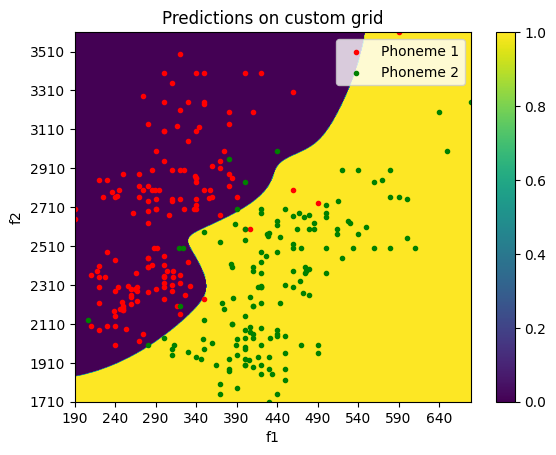

In [ ]:
k = 3

X = X_full[inds_1_and_2,:]

N = X.shape[0]
D = X.shape[1]

min_f1 = int(np.min(X[:,0]))
max_f1 = int(np.max(X[:,0]))
min_f2 = int(np.min(X[:,1]))
max_f2 = int(np.max(X[:,1]))
N_f1 = max_f1 - min_f1
N_f2 = max_f2 - min_f2
print('f1 range: {}-{} | {} points'.format(min_f1, max_f1, N_f1))
print('f2 range: {}-{} | {} points'.format(min_f2, max_f2, N_f2))

#########################################
# Write your code here

# Create a custom grid of shape N_f1 x N_f2
# The grid will span all the values of (f1, f2) pairs, between [min_f1, max_f1] on f1 axis, and between [min_f2, max_f2] on f2 axis
f1_lin = np.linspace(min_f1, max_f1, N_f1)
f2_lin = np.linspace(min_f2, max_f2, N_f2)
M_f1, M_f2 = np.meshgrid(f1_lin, f2_lin, indexing='ij') #two N_f1 x N_f2 matrices with x and y coordinates

pred_points = []
pred_index = []

for i in range(N_f1):
  for j in range(N_f2):
    x_cord = M_f1[i,j]
    y_cord = M_f2[i,j]
    pred_points.append([x_cord,y_cord])
    pred_index.append((i,j))

pred_points = np.array(pred_points)

# Then, classify each point [i.e., each (f1, f2) pair] of that grid, to either phoneme 1, or phoneme 2, using the two trained GMMs
# Do predictions, using GMM trained on phoneme 1, on custom grid
p_id = 1
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_1 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_1 = np.ndarray.tolist(GMM_parameters_phoneme_1)
else:
    raise('File {} does not exist.'.format(npy_filename))
mu = GMM_parameters_phoneme_1['mu']
s = GMM_parameters_phoneme_1['s']
p = GMM_parameters_phoneme_1['p']


Z_phoneme_1 = get_predictions(mu, s, p, pred_points)

# Do predictions, using GMM trained on phoneme 2, on custom grid
p_id = 2
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_2 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_2 = np.ndarray.tolist(GMM_parameters_phoneme_2)
else:
    raise('File {} does not exist.'.format(npy_filename))
mu = GMM_parameters_phoneme_2['mu']
s = GMM_parameters_phoneme_2['s']
p = GMM_parameters_phoneme_2['p']

Z_phoneme_2 = get_predictions(mu, s, p, pred_points)

# Compare these predictions, to classify each point of the grid
Z_phoneme_1_total = Z_phoneme_1.sum(axis=1)
Z_phoneme_2_total = Z_phoneme_2.sum(axis=1)
probs_k3 = np.array((Z_phoneme_1_total, Z_phoneme_2_total)).T

preds_k3 = np.argmax(probs_k3, axis = 1)

# Store these prediction in a 2D numpy array named "M", of shape N_f2 x N_f1 (the first dimension is f2 so that we keep f2 in the vertical axis of the plot)
# M should contain "0.0" in the points that belong to phoneme 1 and "1.0" in the points that belong to phoneme 2
M = np.zeros((N_f2,N_f1))

for i, pred in enumerate(preds_k3):
  ins_cord = pred_index[i]
  M[ins_cord[1],ins_cord[0]] = pred

########################################/


################################################
# Visualize predictions on custom grid

# Create a figure
#fig = plt.figure()
fig, ax = plt.subplots()

# use aspect='auto' (default is 'equal'), to force the plotted image to be square, when dimensions are unequal
plt.imshow(M, aspect='auto')

# set label of x axis
ax.set_xlabel('f1')
# set label of y axis
ax.set_ylabel('f2')

# set limits of axes
plt.xlim((0, N_f1))
plt.ylim((0, N_f2))

# set range and strings of ticks on axes
x_range = np.arange(0, N_f1, step=50)
x_strings = [str(x+min_f1) for x in x_range]
plt.xticks(x_range, x_strings)
y_range = np.arange(0, N_f2, step=200)
y_strings = [str(y+min_f2) for y in y_range]
plt.yticks(y_range, y_strings)

# set title of figure
title_string = 'Predictions on custom grid'
plt.title(title_string)

# add a colorbar
plt.colorbar()

N_samples = int(X.shape[0]/2)
plt.scatter(X[:N_samples, 0] - min_f1, X[:N_samples, 1] - min_f2, marker='.', color='red', label='Phoneme 1')
plt.scatter(X[N_samples:, 0] - min_f1, X[N_samples:, 1] - min_f2, marker='.', color='green', label='Phoneme 2')

# add legend to the subplot
plt.legend()
plt.show()

Now repat with K=6 models

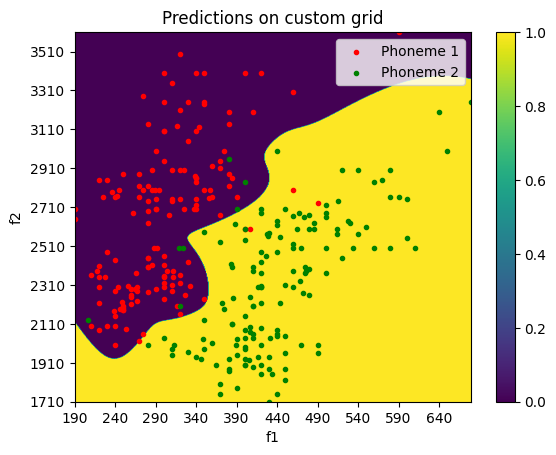

In [ ]:
# same process for k=6
k = 6

# Then, classify each point [i.e., each (f1, f2) pair] of that grid, to either phoneme 1, or phoneme 2, using the two trained GMMs
# Do predictions, using GMM trained on phoneme 1, on custom grid
p_id = 1
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_1 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_1 = np.ndarray.tolist(GMM_parameters_phoneme_1)
else:
    raise('File {} does not exist.'.format(npy_filename))
mu = GMM_parameters_phoneme_1['mu']
s = GMM_parameters_phoneme_1['s']
p = GMM_parameters_phoneme_1['p']


Z_phoneme_1 = get_predictions(mu, s, p, pred_points)

# Do predictions, using GMM trained on phoneme 2, on custom grid
p_id = 2
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_2 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_2 = np.ndarray.tolist(GMM_parameters_phoneme_2)
else:
    raise('File {} does not exist.'.format(npy_filename))
mu = GMM_parameters_phoneme_2['mu']
s = GMM_parameters_phoneme_2['s']
p = GMM_parameters_phoneme_2['p']

Z_phoneme_2 = get_predictions(mu, s, p, pred_points)


# Compare these predictions, to classify each point of the grid
Z_phoneme_1_total = Z_phoneme_1.sum(axis=1)
Z_phoneme_2_total = Z_phoneme_2.sum(axis=1)
probs_k3 = np.array((Z_phoneme_1_total, Z_phoneme_2_total)).T

preds_k3 = np.argmax(probs_k3, axis = 1)

# Store these prediction in a 2D numpy array named "M", of shape N_f2 x N_f1 (the first dimension is f2 so that we keep f2 in the vertical axis of the plot)
# M should contain "0.0" in the points that belong to phoneme 1 and "1.0" in the points that belong to phoneme 2
M = np.zeros((N_f2,N_f1))

for i, pred in enumerate(preds_k3):
  ins_cord = pred_index[i]
  M[ins_cord[1],ins_cord[0]] = pred


# Create a figure
#fig = plt.figure()
fig, ax = plt.subplots()

# use aspect='auto' (default is 'equal'), to force the plotted image to be square, when dimensions are unequal
plt.imshow(M, aspect='auto')

# set label of x axis
ax.set_xlabel('f1')
# set label of y axis
ax.set_ylabel('f2')

# set limits of axes
plt.xlim((0, N_f1))
plt.ylim((0, N_f2))

# set range and strings of ticks on axes
x_range = np.arange(0, N_f1, step=50)
x_strings = [str(x+min_f1) for x in x_range]
plt.xticks(x_range, x_strings)
y_range = np.arange(0, N_f2, step=200)
y_strings = [str(y+min_f2) for y in y_range]
plt.yticks(y_range, y_strings)

# set title of figure
title_string = 'Predictions on custom grid'
plt.title(title_string)

# add a colorbar
plt.colorbar()

N_samples = int(X.shape[0]/2)
plt.scatter(X[:N_samples, 0] - min_f1, X[:N_samples, 1] - min_f2, marker='.', color='red', label='Phoneme 1')
plt.scatter(X[N_samples:, 0] - min_f1, X[N_samples:, 1] - min_f2, marker='.', color='green', label='Phoneme 2')

# add legend to the subplot
plt.legend()
plt.show()

Note that errors are produced with linear dependence between the phonemes

The error is caused by the linear dependence of the columns in X because feature three is a linear combination of features 1 and 2.

This dependency results in a singular covariance matrix. By definition, singular matrices have a zero valued determinant and are non invertible. In the case of the example, this envokes a divide by zero error when evaluating our observations using the multi-variate gaussian distribution. The inverse of the covariance matrix is also needed to make predictions which causes problems as well

Note that the code can run for a few iterations, however I suspect this is due to some built in approach to rounding when calcuating the covariance matrix. The determinants of the covariance matrices in early iterations are very close to zero. In theory, the determinants of the covariance matrices should be zero prior to starting the training loop.

Rough proof showing why the issue occurs below.

Consider the covariance matrix of the data below

$$
\begin{equation}
  \begin{bmatrix}
    Var(F1) & Cov(F1, F2) & Cov(F1, F1+F2) \\
    Cov(F2,F1) & Var(F2) & Cov(F2, F1+F2) \\
    Cov(F1+F2, F1) & Cov(F1 + F2, F2) & Var(F1 + F2)
  \end{bmatrix}
\end{equation}
\\
$$

Using the formula for covariance and E(X+Y) = E(X) + E(Y)

$$
Cov(F1, F1+F2) = \frac{1}{N} ∑(F1-\mu_1)(F1 + F2 -\mu_1 -\mu_2) \\
\\
= \frac{1}{N} ∑(F1-\mu_1)^{2} + \frac{1}{N} ∑(F1 -\mu_1)(F2 -\mu_2) \\
\\
= Var(F1) + Cov(F1,F2) \\
$$

You can use the same method to show that

$$
\\
Cov(F2, F1+F2) = Var(F2) + Cov(F1,F2)
\\
$$

Considering that Var(X+Y) = Var(X) + Var(Y) + 2cov(X,Y) we get the covariance matrix:

$$
\\
\begin{equation}
  \begin{bmatrix}
    Var(F1) & Cov(F1, F2) & Var(F1) + Cov(F1,F2) \\
    Cov(F2,F1) & Var(F2) & Var(F2) + Cov(F1,F2) \\
    Var(F1) + Cov(F1,F2) & Var(F2) + Cov(F1,F2) & Var(F1)+Var(F2)+2Cov(F1,F2)
  \end{bmatrix}
\end{equation}
$$

The vector $v = (-1,-1,1)$ shows the dependency between the columns.

Initial Determinant 0
0.0
column 3 minus sum of columns 1 and 2
[-3.63797881e-12  2.91038305e-11  5.82076609e-11]
Initial Determinant 1
0.0
column 3 minus sum of columns 1 and 2
[-3.63797881e-12  2.91038305e-11  5.82076609e-11]
Initial Determinant 2
0.0
column 3 minus sum of columns 1 and 2
[-3.63797881e-12  2.91038305e-11  5.82076609e-11]
Iteration 001/150
-0.0002890625959567485
-0.0002890625959567485
-0.0002890625959567485
Iteration 002/150
-0.0007231256308806115
0.0063195989975976825
0.013189100373585162
Iteration 003/150
-4.944931754927205e-06
-0.001267651034325099
-0.00359711493095428
Iteration 004/150
5.79451092941729e-05
-0.010741712140771659
-0.007079417343570483
Iteration 005/150
0.00020843874643461122
0.0
-0.002031208788407282


<ipython-input-7-c634f765d6d0>:33: RuntimeWarning: divide by zero encountered in double_scalars
  Z[:, i] = p[i]*(1/np.power(((2*np.pi)**D) * np.abs(s_i_det), 0.5)) * np.exp(-0.5*np.sum(x_s_x, axis=1))


ValueError: ignored

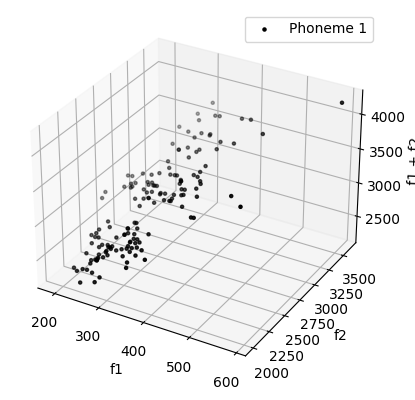

In [ ]:
p_id = 1 # id of the phoneme that will be used (e.g. 1, or 2)

k = 3 # number of GMM components
X = np.zeros((len(f1), 3))
#########################################
# Write your code here
# The shape of X is be two-dimensional. Each row will represent a sample of the dataset, and each column will represent a feature (e.g. f1 or f2 or f1+f2)
# Store f1 in the first column of X, f2 in the second column of X and f1+f2 in the third column of X
# Filter X to, contain only samples that belong to the chosen phoneme.

#Create X
X[:,0] = f1.copy()
X[:,1] = f2.copy()
X[:,2] = X[:,0] + X[:,1]

#Filter based on phoneme label
i_1 = np.where(phoneme_id==1)
i_1 = i_1[0]

X = X[i_1,:]

#########################################
fig = plt.figure()
ax1 = plt.axes(projection='3d')
title_string = 'Phoneme {}'.format(p_id)
plot_data_3D(X=X, title_string=title_string, ax=ax1)

N, D = X.shape
p = np.ones((k))/k
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
s = np.zeros((k,D,D)) # shape kxDxD
n_iter = 150

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    s[i,:,:] = cov_matrix/k

    print('Initial Determinant {}'.format(i))
    print(scipy.linalg.det(cov_matrix))
    print('column 3 minus sum of columns 1 and 2')
    dif = cov_matrix[:,2] - (cov_matrix[:,0] + cov_matrix[:,1])
    print(dif)

Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
for t in range(n_iter):
    #print('****************************************')
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    #prior to E-step printing determinents
    for i in range(k):
      print(scipy.linalg.det(s[i]))
    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')
    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(), Z[:,i])/np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with full covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)

        #dxn matrix as representing first to of cov calc
        term_1 = X.transpose() - mu_i_repeated
        #nxd matrix where each element is the prob of obs in row being in dist i
        #mutlied with dxn matrix in term 1 to produce weighted cov matrix
        term_2 = np.repeat(np.expand_dims(Z[:,i], axis=1), D, axis=1) * term_1.transpose()
        #cov divided by sum of normalized obs probs to conclude calc of weighted cov
        s[i,:,:] = np.matmul(term_1, term_2)/np.sum(Z[:,i])
        p[i] = np.mean(Z[:,i])

plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
plt.show()

We can impose a constraint on the covariance matrices so that they must be invertible. The method I chose was multiplying the covmatrix by the identity matrix. The result is a diagonal matrix containing the variances of each dimension.

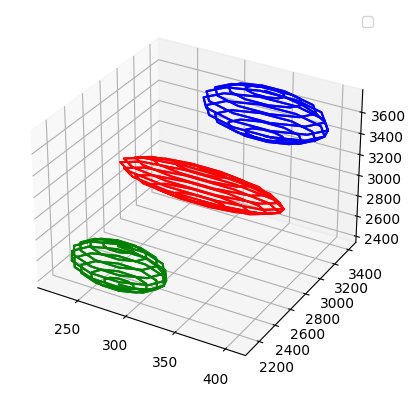

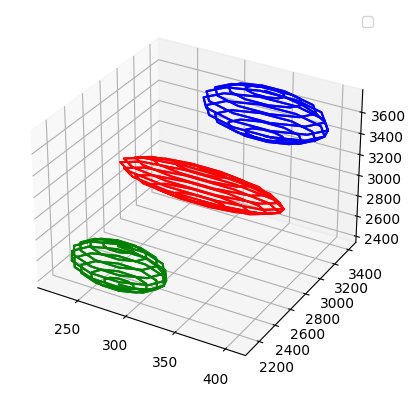

Mu Vectors

[[ 312.71185172 2784.95324317 3097.66509489]
 [ 270.36641238 2284.79597714 2555.16238953]
 [ 342.77868248 3226.57180195 3569.35048443]]
Covariance Matrices

[[[ 3545.77992651     0.             0.        ]
  [    0.          7550.61793983     0.        ]
  [    0.             0.         11152.39176266]]

 [[ 1215.42238018     0.             0.        ]
  [    0.         14023.67547568     0.        ]
  [    0.             0.         17437.88651288]]

 [[ 2005.59065502     0.             0.        ]
  [    0.         18663.24652168     0.        ]
  [    0.             0.         22269.11223975]]]
Mixture Coefficients

[0.38842461 0.4345021  0.17049434]


In [ ]:
p_id = 1 # id of the phoneme that will be used (e.g. 1, or 2)

k = 3 # number of GMM components

#create data
X = np.zeros((len(f1), 3))
X[:,0] = f1.copy()
X[:,1] = f2.copy()
X[:,2] = X[:,0] + X[:,1]

#Filter based on phoneme label
i_1 = np.where(phoneme_id==1)
i_1 = i_1[0]

X = X[i_1,:]


fig = plt.figure()
ax1 = plt.axes(projection='3d')
title_string = 'Phoneme {}'.format(p_id)
plot_data_3D(X=X, title_string=title_string, ax=ax1)

N, D = X.shape
p = np.ones((k))/k
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
s = np.zeros((k,D,D)) # shape kxDxD
n_iter = 150

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    vars = np.diag(cov_matrix.diagonal())
    cov_matrix = np.matmul(vars, np.identity(3))
    s[i,:,:] = cov_matrix/k

Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
for t in range(n_iter):
    #print('****************************************')
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')
    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(), Z[:,i])/np.sum(Z[:,i])

        # We will fit Gaussians with constrained covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)

        term_1 = X.transpose() - mu_i_repeated
        term_2 = np.repeat(np.expand_dims(Z[:,i], axis=1), D, axis=1) * term_1.transpose()
        cov = np.matmul(term_1, term_2)/np.sum(Z[:,i])
        #Constraint. only weighted diagonal of weighted cov is selected
        s[i,:,:] = np.diag(cov.diagonal())

        p[i] = np.mean(Z[:,i])

plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
plt.show()
print('Mu Vectors\n')
print(mu)

print('Covariance Matrices\n')
print(s)

print('Mixture Coefficients\n')
print(p)

#saving just in case
GMM_parameters = {}
GMM_parameters['mu'] = mu
GMM_parameters['s'] = s
GMM_parameters['p'] = p
if not os.path.isdir('data/'):
  os.mkdir('data/')
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}_3D.npy'.format(p_id, k)
np.save(npy_filename, GMM_parameters)